[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/MaxMitre/Aplicaciones-Financieras/blob/main/Semana11/1_Clustering_Series_de_Tiempo.ipynb)

### Introducción
Vamos a explorar técnicas para agrupar series de tiempo.

### Contenido
- <a href='#1'>1. Descripción de los datos</a>
- <a href='#2'>2. Lidiar con datos faltantes</a>
- <a href='#3'>3. Extracción de características de series de tiempo</a>
- <a href='#4'>4. Métodos de clusterización</a>
    - <a href='#4.1'>4.1 Suavizado de series de tiempo</a>
    - <a href='#4.2'>4.2 Reescalamiento de series de tiempo</a>
    - <a href='#4.3'>4.3 K-means a series de tiempo</a>
    - <a href='#4.4'>4.4 Reducción de espacio de características</a>
        - <a href='#4.4.1'>4.4.1 t-SNE</a>
        - <a href='#4.4.2'>4.4.2 MultiDimensional Scaling (MDS)</a>
    - <a href='#4.5'>4.5 Hierarchical Agglomerative Clustering (HAC)</a>
    - <a href='#4.6'>4.6 Resultado de KMeans a series de tiempo</a>
- <a href='#5'>5. Extracción de series por Cluster</a>
    - <a href='#5.1'>5.1 Cluster Series DBA</a>
- <a href='#6'>6. Encajes a series de tiempo</a>
- <a href='#7'>7. Referencias</a>

In [ ]:
! git clone https://github.com/tejaslodaya/timeseries-clustering-vae.git
! pip install tslearn
#! pip uninstall scikit-learn --yes
! pip install scikit-learn
#==0.24.1

Cloning into 'timeseries-clustering-vae'...
remote: Enumerating objects: 116, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 116 (delta 36), reused 35 (delta 35), pack-reused 75 (from 1)
Receiving objects: 100% (116/116), 3.94 MiB | 5.93 MiB/s, done.
Resolving deltas: 100% (57/57), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 2.9 MB/s eta 0:00:00


In [ ]:
!pip show scikit-learn

Name: scikit-learn
Version: 1.6.1
Summary: A set of python modules for machine learning and data mining
Home-page: https://scikit-learn.org
Author: 
Author-email: 
License: BSD 3-Clause License

 Copyright (c) 2007-2024 The scikit-learn developers.
 All rights reserved.

 Redistribution and use in source and binary forms, with or without
 modification, are permitted provided that the following conditions are met:

 * Redistributions of source code must retain the above copyright notice, this
   list of conditions and the following disclaimer.

 * Redistributions in binary form must reproduce the above copyright notice,
   this list of conditions and the following disclaimer in the documentation
   and/or other materials provided with the distribution.

 * Neither the name of the copyright holder nor the names of its
   contributors may be used to endorse or promote products derived from
   this software without specific prior written permission.

 THIS SOFTWARE IS PROVIDED BY THE COPYR

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os

from tslearn.clustering import TimeSeriesKMeans
from tslearn.barycenters import dtw_barycenter_averaging

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE, MDS
from sklearn.cluster import AgglomerativeClustering

from scipy.cluster.hierarchy import dendrogram
from tqdm import tqdm

warnings.filterwarnings("ignore")
sns.set_style("darkgrid")

SEED=23

### Descripción de los datos

En total, tenemos 54 tiendas diferentes en donde hay 33 categorias de productos distintas. Hay una problemática típica en ventas: "Predicción de ventas para cada categoría de productos o incluso cierto producto en ciertas tiendas."

De acuerdo a los datos tenemos que podemos realizar varias tareas de Clusterizar series de tiempo:
- Cluster por categorias de productos
- Cluster por tiendas

Esto puede ayudarnos a:
- Encontrar patrones similares en/entre categrias/tiendas
- Reducir el número de modelos a ser entrenados
- Etc.


**Encontraremos similitudes entre tiendas de acuerdo a sus ventas totales**

In [ ]:
# Lectura de datos
data = pd.read_csv('/content/drive/MyDrive/Academy/Diplomado_Finanazas&IA/Cruso-ApsFinancieras/semana9/train.csv', parse_dates=['date'])
data

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB


In [ ]:
a = data.date[1]
a

Timestamp('2013-01-01 00:00:00')

In [ ]:
b = data.date[1000000]
b

Timestamp('2014-07-17 00:00:00')

In [ ]:
(b-a)

Timedelta('562 days 00:00:00')

In [ ]:
a + pd.Timedelta('30 days')

Timestamp('2013-01-31 00:00:00')

Número de tiendas únicas y categorias de productos únicos.

In [ ]:
print('Número de tiendas: ', data['store_nbr'].nunique())
print('Categorias de productos: ', data['family'].unique().shape[0])

Número de tiendas:  54
Categorias de productos:  33


In [ ]:
# Asegurarnos que todas las tiendas tienen todos los productos únicos
assert data.groupby(['store_nbr', 'family']).size().shape[0] == 54*33

In [ ]:
# Series de tiempo para encontrar tiendas similares
store_sales = data.groupby(['date', 'store_nbr'], as_index=False).aggregate({'sales': 'sum'})

In [ ]:
store_sales

,date,store_nbr,sales
0,2013-01-01,1,0.000000
1,2013-01-01,2,0.000000
2,2013-01-01,3,0.000000
3,2013-01-01,4,0.000000
4,2013-01-01,5,0.000000
...,...,...,...
90931,2017-08-15,50,16879.121004
90932,2017-08-15,51,20154.559000
90933,2017-08-15,52,18600.046000
90934,2017-08-15,53,8208.189000


In [ ]:
# Un ejemplo del grupo, sin el aggregate
data.groupby(['date', 'store_nbr'], as_index=False).get_group((pd.to_datetime('01-03-2015'), 50 ))

,id,date,store_nbr,family,sales,onpromotion
1302345,1302345,2015-01-03,50,AUTOMOTIVE,19.000,0
1302346,1302346,2015-01-03,50,BABY CARE,0.000,0
1302347,1302347,2015-01-03,50,BEAUTY,14.000,0
1302348,1302348,2015-01-03,50,BEVERAGES,2897.000,4
1302349,1302349,2015-01-03,50,BOOKS,0.000,0
1302350,1302350,2015-01-03,50,BREAD/BAKERY,917.617,2
1302351,1302351,2015-01-03,50,CELEBRATION,0.000,0
1302352,1302352,2015-01-03,50,CLEANING,2962.000,2
1302353,1302353,2015-01-03,50,DAIRY,1345.000,3
1302354,1302354,2015-01-03,50,DELI,714.646,1


Ejemplo de la series de tiempo:

In [ ]:
store_sales[store_sales['store_nbr'] == 2]

,date,store_nbr,sales
1,2013-01-01,2,0.000000
55,2013-01-02,2,10266.718981
109,2013-01-03,2,7612.540000
163,2013-01-04,2,7526.377000
217,2013-01-05,2,9539.566000
...,...,...,...
90667,2017-08-11,2,13081.771001
90721,2017-08-12,2,12382.416000
90775,2017-08-13,2,13766.822095
90829,2017-08-14,2,12211.461020


In [ ]:
# Series de tiempo para encontrar similaridades entre categorias de productos
product_sales = data.groupby(['date', 'store_nbr', 'family'], as_index=False).aggregate({'sales': 'sum'})

Ejemplo de la serie de tiempo:

In [ ]:
product_sales[product_sales['store_nbr'] == 1][product_sales['family'] == 'AUTOMOTIVE']

,date,store_nbr,family,sales
0,2013-01-01,1,AUTOMOTIVE,0.0
1782,2013-01-02,1,AUTOMOTIVE,2.0
3564,2013-01-03,1,AUTOMOTIVE,3.0
5346,2013-01-04,1,AUTOMOTIVE,3.0
7128,2013-01-05,1,AUTOMOTIVE,5.0
...,...,...,...,...
2991978,2017-08-11,1,AUTOMOTIVE,1.0
2993760,2017-08-12,1,AUTOMOTIVE,6.0
2995542,2017-08-13,1,AUTOMOTIVE,1.0
2997324,2017-08-14,1,AUTOMOTIVE,1.0


In [ ]:
product_sales.query('store_nbr == 1 & family == "AUTOMOTIVE"')

,date,store_nbr,family,sales
0,2013-01-01,1,AUTOMOTIVE,0.0
1782,2013-01-02,1,AUTOMOTIVE,2.0
3564,2013-01-03,1,AUTOMOTIVE,3.0
5346,2013-01-04,1,AUTOMOTIVE,3.0
7128,2013-01-05,1,AUTOMOTIVE,5.0
...,...,...,...,...
2991978,2017-08-11,1,AUTOMOTIVE,1.0
2993760,2017-08-12,1,AUTOMOTIVE,6.0
2995542,2017-08-13,1,AUTOMOTIVE,1.0
2997324,2017-08-14,1,AUTOMOTIVE,1.0


Buscaremos tiendas similares por ventas.

### <a id='2'>2. Lidiar con datos faltantes</a>

In [ ]:
# Revisar si tenemos tiendas con cero ventas
stores_to_drop = []
for store in store_sales['store_nbr'].unique():
    if (store_sales.query(f'store_nbr == {store}')['sales'] == 0).all():
        stores_to_drop.append(store)

print('Tiendas sin ventas: ', stores_to_drop)

# Eliminar columnas de tiendas sin ventas
store_sales = store_sales[~store_sales['store_nbr'].isin(stores_to_drop)]

Tiendas sin ventas:  []


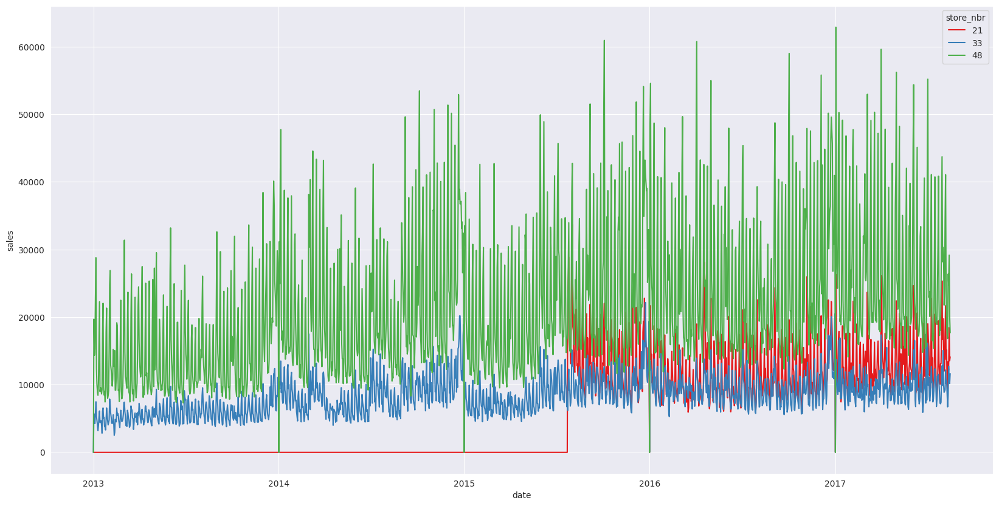

In [ ]:
# Veamos como se comportan 3 tiendas (al azar), para ejemplificar son buenas [21, 33, 48]
rand_stores = np.random.choice(store_sales['store_nbr'].unique(), 3)
rand_stores = np.array([21, 33, 48])
selected_stores = store_sales[store_sales['store_nbr'].isin(rand_stores)][['date', 'store_nbr', 'sales']]

plt.figure(figsize=(20,10))
plt.grid(True)
sns.lineplot(data=selected_stores, x='date', y='sales', hue='store_nbr', ci=False, legend=True, palette='Set1');

In [ ]:
store_sales[store_sales['store_nbr'] == 21]

,date,store_nbr,sales
20,2013-01-01,21,0.00000
74,2013-01-02,21,0.00000
128,2013-01-03,21,0.00000
182,2013-01-04,21,0.00000
236,2013-01-05,21,0.00000
...,...,...,...
90686,2017-08-11,21,13442.33200
90740,2017-08-12,21,12150.30900
90794,2017-08-13,21,18442.57001
90848,2017-08-14,21,13558.10900


Hay valores faltantes que fueron tomados como cero la no tener registros. Esto puede afectar la clusterización, ¿Porqué?

Apliquemos una pequeña restricción, un umbral de 3% de data faltante.

In [ ]:
# Encontrar tiendas problematicas
store_to_drop = []
for store in store_sales['store_nbr'].unique():
    current_store = store_sales.query(f'store_nbr == {store}')
    if current_store.query('sales == 0').shape[0]/current_store.shape[0] > 0.03:
        store_to_drop.append(store)

print('Tiendas con problemas: ', store_to_drop)

# Deshacernos de las tiendas con problemas
store_sales = store_sales[~store_sales['store_nbr'].isin(store_to_drop)]

Tiendas con problemas:  [np.int64(12), np.int64(18), np.int64(20), np.int64(21), np.int64(22), np.int64(24), np.int64(25), np.int64(29), np.int64(36), np.int64(42), np.int64(52), np.int64(53)]


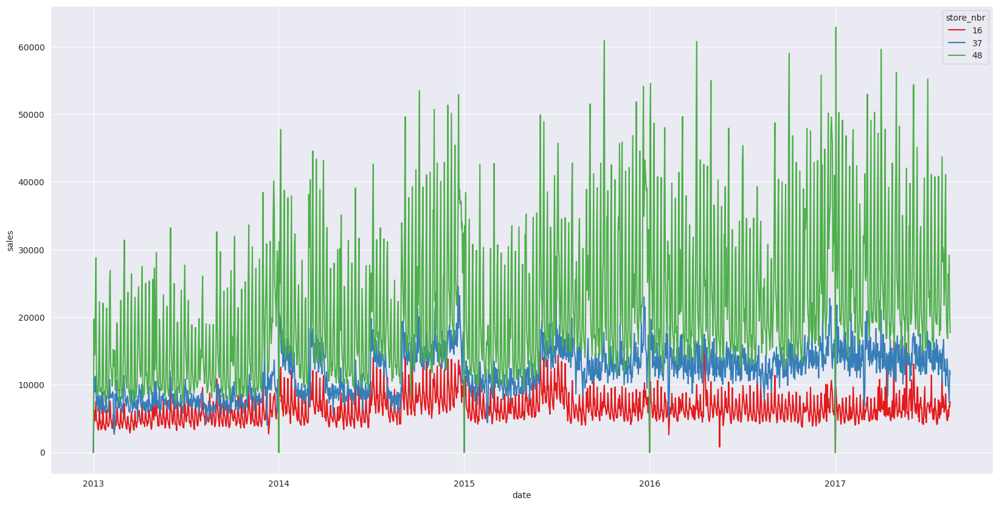

In [ ]:
# Veamos como se comportan 3 tiendas (al azar), para ejemplificar son buenas [21, 33, 48]
rand_stores = np.random.choice(store_sales['store_nbr'].unique(), 3)

selected_stores = store_sales[store_sales['store_nbr'].isin(rand_stores)][['date', 'store_nbr', 'sales']]

plt.figure(figsize=(20,10))
plt.grid(True)
sns.lineplot(data=selected_stores, x='date', y='sales', hue='store_nbr', ci=False, legend=True, palette='Set1');

Además, hay que rellenar cualquier otro ruido faltante.

In [ ]:
# Primero, convirtamos los ceros a NaN
store_sales['sales'] = store_sales['sales'].apply(lambda x: np.nan if x == 0 else x)

# Rellenamos los vacíos
res_df = pd.DataFrame()
for store in store_sales['store_nbr'].unique():
    current_store = store_sales.query(f'store_nbr == {store}')
    # ¿Cómo estamos rellenando?
    current_store['sales'].interpolate(method ='linear', limit_direction ='forward', inplace=True)
    # Hay fechas como 01-01-YYYYY, hay que llenar estas de algún modo, pues son días festivos (¿con que las estamos llenando?)
    current_store['sales'].fillna(method ='bfill', inplace=True)
    res_df = res_df._append(current_store)

store_sales = res_df

In [ ]:
store_sales

,date,store_nbr,sales
0,2013-01-01,1,7417.148000
54,2013-01-02,1,7417.148000
108,2013-01-03,1,5873.244001
162,2013-01-04,1,5919.879001
216,2013-01-05,1,6318.785010
...,...,...,...
90719,2017-08-11,54,8513.834000
90773,2017-08-12,54,9139.678002
90827,2017-08-13,54,14246.827996
90881,2017-08-14,54,11882.994000


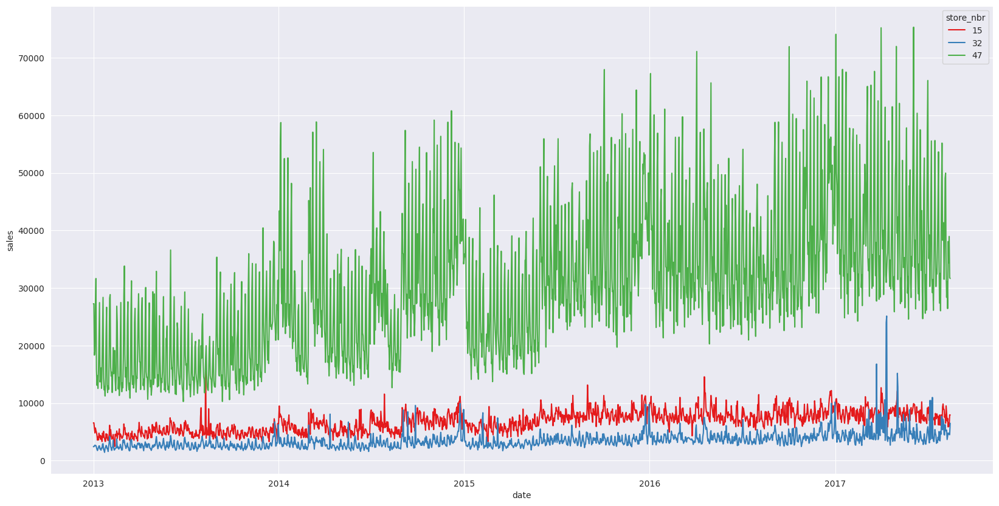

In [ ]:
# Veamos otras cinco tiendas, pueden servir [15, 47, 32]
rand_stores = np.random.choice(store_sales['store_nbr'].unique(), 3)
rand_stores = np.array([15, 47, 32])
selected_stores = store_sales[store_sales['store_nbr'].isin(rand_stores)][['date', 'store_nbr', 'sales']]

plt.figure(figsize=(20,10))
plt.grid(True)
sns.lineplot(data=selected_stores, x='date', y='sales', hue='store_nbr', ci=False, legend=True, palette='Set1');

### <a id='3'>3. Extracción de características de series de tiempo</a>

En general, la clusterización de series de tiempo se puede dividir en 2 tipos:

- **Feature-Based**: Tratando de extraer lo mas posible de la señal de la serie de tiempo (feature extraction)
- **Raw data-Based**: Trabajar directamente con la serie de tiempo, sin procesarla

Usaremos el tipo **Raw-data Based**. Tendremos una matriz donde:
- Filas: Distintas series de tiempo (tiendas, en nuestro caso)
- Características: Observaciones temporales (ventas)

Trabajaremos con dimensiones grandes, y esto podría hacer que nos toparamos con la  **Maldición de la dimensionalidad**.

Para prevenir esto, usaremos **métodos de reducción de dimensión** (t-SNE, PCA, MDS...)

### <a id='4'>4. Métodos de clusterización</a>

Nos centraremos en estos 2 métodos:
- `K-Means/TimeSeriesKMeans: (ts_learn library)`
- `Hierarchical Agglomerative Clustering`

Pero también pudieran aplicar otros algoritmos

**Si la serie de tiempo es una señal** (datos de varios dispositivos), entonces la mejor forma de extraer características puede ser algún método de `procesamiento de señales`

Ejemplo: transformadas de Fourier, spectrogramas, etc.

**Si las series con ruidosas, tal vez sea bueno volveras un poco mas "smooth"** para tratar de evitar encontrar falsos patrones

### <a id='4.1'>4.1 Suavizado de series de tiempo</a>
Apliquemos un "moving average" (window size = 7: tendencia semanal )

In [ ]:
# Suavizado de series de tiempo
res_df = pd.DataFrame()
for store in store_sales['store_nbr'].unique():
    current_store = store_sales.query(f'store_nbr == {store}')
    current_store['smoth_7'] = current_store['sales'].rolling(7).mean()
    res_df = res_df._append(current_store[['date', 'store_nbr', 'smoth_7']])

store_sales = res_df
store_sales = store_sales.dropna()

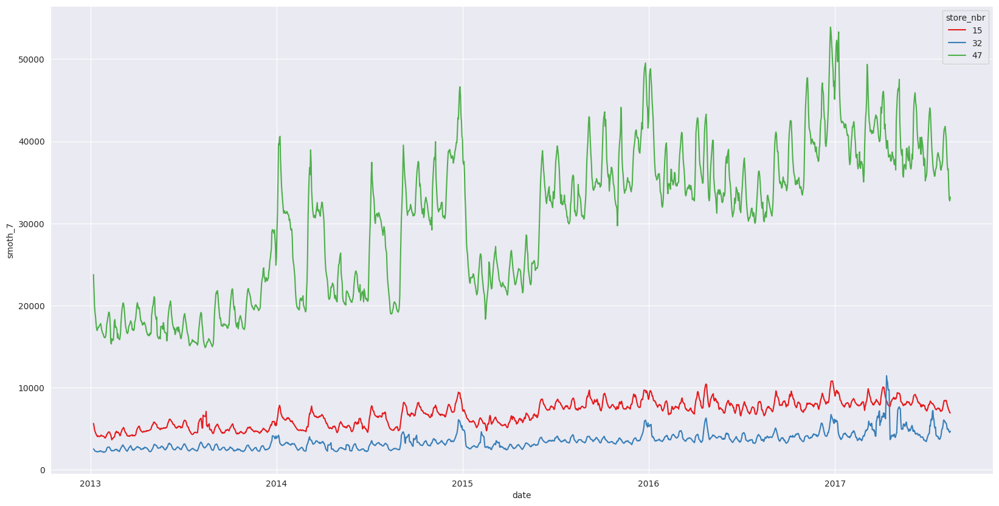

In [ ]:
rand_stores = np.random.choice(store_sales['store_nbr'].unique(), 3)
rand_stores = np.array([15, 47, 32])

selected_stores = store_sales[store_sales['store_nbr'].isin(rand_stores)][['date', 'store_nbr', 'smoth_7']]

plt.figure(figsize=(20,10))
plt.grid(True)
sns.lineplot(data=selected_stores, x='date', y='smoth_7', hue='store_nbr', ci=False, legend=True, palette='Set1');

In [ ]:
selected_stores

,date,store_nbr,smoth_7
338,2013-01-07,15,5645.093569
392,2013-01-08,15,5341.166712
446,2013-01-09,15,4912.932284
500,2013-01-10,15,4687.991141
554,2013-01-11,15,4513.267285
...,...,...,...
90712,2017-08-11,47,36644.446431
90766,2017-08-12,47,34549.075860
90820,2017-08-13,47,32977.488289
90874,2017-08-14,47,32741.431431


Ya preprocesamos, creemos una matriz de características

In [ ]:
# Matriz de características con dimensión (n_series x time_observations)
series_df = store_sales.pivot(index='store_nbr', columns='date', values='smoth_7')
series_df = series_df.dropna(axis='columns')
series_df.head()

date,2013-01-07,2013-01-08,2013-01-09,2013-01-10,2013-01-11,2013-01-12,2013-01-13,2013-01-14,2013-01-15,2013-01-16,...,2017-08-06,2017-08-07,2017-08-08,2017-08-09,2017-08-10,2017-08-11,2017-08-12,2017-08-13,2017-08-14,2017-08-15
store_nbr,,,,,,,,,,,,,,,,,,,,,
1,5899.459287,5639.464002,5552.525572,5393.164286,5332.326711,5210.754993,5281.439422,5210.119566,5153.975709,5143.263854,...,10428.784454,10273.271739,10164.824595,9887.127421,10139.121564,9175.385001,8911.962716,8839.610430,8824.635859,8646.463291
2,8887.182852,8293.303999,7789.560719,7497.060149,7344.689860,7155.466146,7113.580432,7011.729860,6973.436716,7031.291285,...,14767.896711,14574.045140,14058.723283,13517.407426,13432.772997,13155.712997,12867.478572,12407.371871,12382.944445,12367.473731
3,21309.183432,19903.479004,18571.307575,17664.474286,17322.393286,16951.272286,16220.773571,15816.011714,15764.571857,16072.139000,...,36557.121062,36254.564491,35371.760061,34381.459486,33827.249200,33377.379499,32331.131714,31308.238757,31418.174617,31665.997332
4,9011.247709,8413.751997,7794.866143,7405.437714,7292.229000,6906.059572,6762.865715,6570.237715,6580.531286,6757.516001,...,13297.303720,13096.118149,12497.235144,12094.151430,11988.850572,11443.846571,11073.197429,10539.605571,10639.284286,10631.973000
5,8831.428437,8235.605577,7586.818289,7326.796292,7188.557864,7008.930436,6786.283429,6732.307714,6701.073286,6810.330997,...,10699.762714,10587.323000,10086.574999,9630.471141,9792.568999,9730.554570,9292.716427,9118.467427,8975.597984,9094.964843


In [ ]:
series_df.shape

(42, 1678)

# Fin de la clase del Martes (primer clase)

### <a id='4.2'>4.2 Reescalamiento de series de tiempo</a>

¿Qué hay que tener en cuenta al reescalar los datos?

In [ ]:
scaler = StandardScaler()

In [ ]:
scaler

StandardScaler()

In [ ]:
# Primer traspuesta - para tener las series de tiempo en columnas
# Segunda traspuesta - volver a la matriz original (n_series x time_observations)
scaler = StandardScaler()
scaled_ts = scaler.fit_transform(series_df.T).T

In [ ]:
scaled_ts

array([[-1.0361825 , -1.14246107, -1.177999  , ...,  0.16566649,
         0.15954531,  0.08671351],
       [-1.00302621, -1.15316557, -1.28051763, ..., -0.11308219,
        -0.11925772, -0.12316889],
       [-0.95826339, -1.11160541, -1.25692604, ...,  0.13248887,
         0.14448129,  0.17151516],
       ...,
       [-0.55769786, -0.7622962 , -0.98330671, ...,  0.45964029,
         0.40615859,  0.40841715],
       [-1.14362828, -1.27181105, -1.33808946, ...,  0.3568657 ,
         0.2937443 ,  0.37599439],
       [-1.01674954, -1.19130877, -1.36424011, ...,  1.96020797,
         2.06646505,  2.10382455]])

In [ ]:
pd.DataFrame(scaled_ts, columns=series_df.columns, index=series_df.index)

date,2013-01-07,2013-01-08,2013-01-09,2013-01-10,2013-01-11,2013-01-12,2013-01-13,2013-01-14,2013-01-15,2013-01-16,...,2017-08-06,2017-08-07,2017-08-08,2017-08-09,2017-08-10,2017-08-11,2017-08-12,2017-08-13,2017-08-14,2017-08-15
store_nbr,,,,,,,,,,,,,,,,,,,,,
1,-1.036182,-1.142461,-1.177999,-1.243141,-1.268010,-1.317705,-1.288811,-1.317965,-1.340915,-1.345293,...,0.815275,0.751706,0.707376,0.593861,0.696869,0.302921,0.195242,0.165666,0.159545,0.086714
2,-1.003026,-1.153166,-1.280518,-1.354465,-1.392986,-1.440824,-1.451413,-1.477162,-1.486843,-1.472217,...,0.483685,0.434678,0.304398,0.167547,0.146151,0.076107,0.003238,-0.113082,-0.119258,-0.123169
3,-0.958263,-1.111605,-1.256926,-1.355848,-1.393165,-1.433648,-1.513335,-1.557489,-1.563100,-1.529549,...,0.705066,0.672061,0.575760,0.467733,0.407276,0.358202,0.244072,0.132489,0.144481,0.171515
4,-0.744469,-0.940702,-1.143961,-1.271860,-1.309041,-1.435869,-1.482898,-1.546162,-1.542782,-1.484655,...,0.663188,0.597113,0.400424,0.268040,0.233457,0.054463,-0.067269,-0.242515,-0.209777,-0.212179
5,-0.238741,-0.542624,-0.873520,-1.006137,-1.076642,-1.168256,-1.281811,-1.309339,-1.325270,-1.269546,...,0.714152,0.656805,0.401412,0.168789,0.251462,0.219834,-0.003474,-0.092345,-0.165211,-0.104331
6,-0.791390,-0.997354,-1.199431,-1.341613,-1.390450,-1.470287,-1.554330,-1.580329,-1.588576,-1.543097,...,0.667687,0.658933,0.511844,0.373437,0.298579,0.309068,0.124154,0.031715,-0.047609,-0.037699
7,-1.205860,-1.309603,-1.438822,-1.495326,-1.528096,-1.567189,-1.584323,-1.626157,-1.634690,-1.606115,...,0.538637,0.505978,0.411122,0.304354,0.280060,0.177633,0.133481,0.080902,0.106187,0.158533
8,-0.992643,-1.161222,-1.290748,-1.347278,-1.356451,-1.402368,-1.407589,-1.422953,-1.415394,-1.395498,...,0.782679,0.721848,0.605449,0.488052,0.455596,0.385719,0.203212,0.102488,0.121475,0.164679
9,-0.787503,-1.021025,-1.331104,-1.447571,-1.530077,-1.628339,-1.723720,-1.731853,-1.758128,-1.734367,...,1.551120,1.556341,1.182206,0.973384,0.724386,0.637109,0.449232,0.192847,0.025075,0.094037


### <a id='4.3'>4.3 K-Means a series de tiempo</a>

Utilizaremos `K-Means`, pero con un pequeño giro: lo haremos utilizando el it is better to use the **Raw-Data Approach**. Si utilizan el `Feature-Based approach`, utilizar alguna de las siguientes librerias puede ayudar:
- <a href='https://github.com/fraunhoferportugal/tsfel'>ts_fel</a>
- <a href='https://github.com/blue-yonder/tsfresh'>ts_fresh</a>

Es importante definir como mediremos que tan parecidas son las series de tiempo, con K-Means podemos usar:
- `Euclidean distance`
- `Dynamic Time Warping Matching (DTW)`


Si usamos <a href='https://tslearn.readthedocs.io/en/stable/user_guide/dtw.html'> Dynamic Time Warping Matching </a> el **Feature-Based approach** no funciona, pues este método trata de determinar similaridades de las series de tiempo

Primero, aplicamos K-Means del módulo <a href='https://tslearn.readthedocs.io/en/stable/index.html'>ts_learn</a>

In [ ]:
# Corre K-Means y muestra los resultados
def get_kmeans_results(data, max_clusters=10, metric='euclidean', seed=23):
    """
    Runs KMeans n times (according to max_cluster range)

    data: pd.DataFrame or np.array
        Time Series Data
    max_clusters: int
        Number of different clusters for KMeans algorithm
    metric: str
        Distance metric between the observations
    seed: int
        random seed
    Returns:
    -------
    None
    """
    # Métricas principales
    distortions = []
    silhouette = []
    clusters_range = range(1, max_clusters+1)

    for K in tqdm(clusters_range):
        kmeans_model = TimeSeriesKMeans(n_clusters=K, metric=metric, n_jobs=-1, max_iter=10, random_state=seed)
        kmeans_model.fit(data)
        distortions.append(kmeans_model.inertia_)
        if K > 1:
            silhouette.append(silhouette_score(data, kmeans_model.labels_))

    # Visualization
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distortion')
    plt.title('Elbow Method')

    plt.figure(figsize=(10,4))
    plt.plot(clusters_range[1:], silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette');

Tratemos de encontrar similaridades con DTW

100%|██████████| 5/5 [09:59<00:00, 119.85s/it]


CPU times: user 9min 56s, sys: 1min 59s, total: 11min 56s
Wall time: 9min 59s


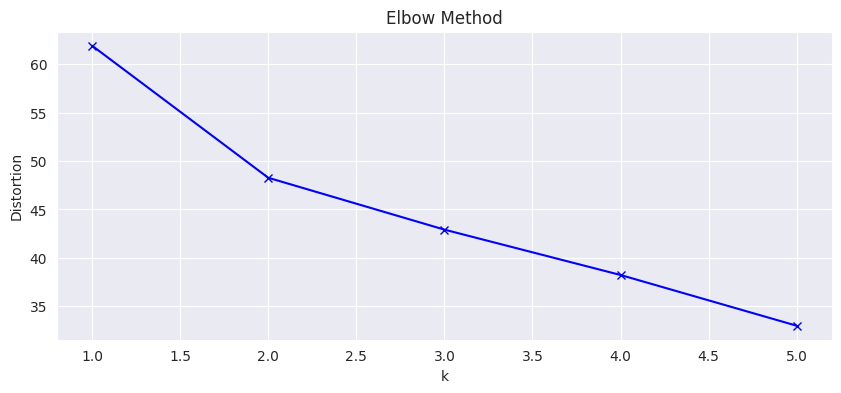

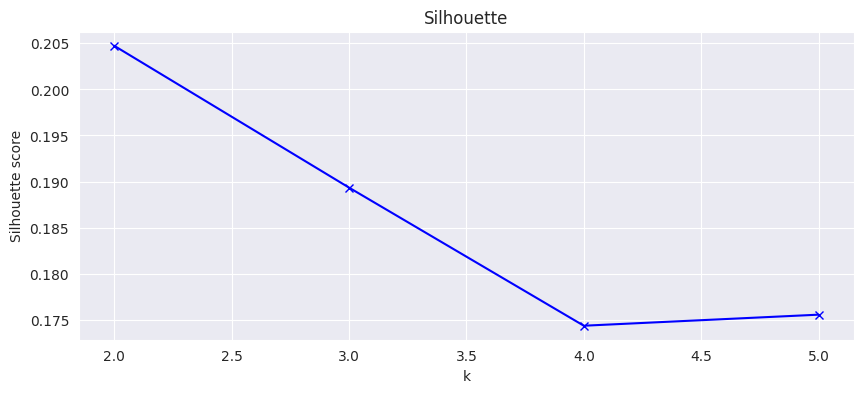

In [ ]:
%%time
# como 10 minutos


# Run the algorithm using DTW algorithm
get_kmeans_results(data=scaled_ts, max_clusters=5, metric='dtw', seed=SEED)

Selecciones algunos con el método silhouette y visualicemos los cluster

In [ ]:
# Visualizar los cluster obtenidos
def plot_clusters(data, cluster_model, dim_red_algo):
    """
    Plots clusters obtained by clustering model

    data: pd.DataFrame or np.array
        Time Series Data
    cluster_model: Class
        Clustering algorithm
    dim_red_algo: Class
        Dimensionality reduction algorithm (e.g. TSNE/PCA/MDS...)
    Returns:
    -------
    None
    """
    cluster_labels = cluster_model.fit_predict(data)
    centroids = cluster_model.cluster_centers_
    u_labels = np.unique(cluster_labels)

    # Ver los centroides
    plt.figure(figsize=(16, 10))
    plt.scatter(centroids[:, 0] , centroids[:, 1] , s=150, color='r', marker="x")

    # Bajar la dimensión de los datos a 2D
    if data.shape[1] > 2:
        data_2d = dim_red_algo.fit_transform(data)
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)
    else:
        for u_label in u_labels:
            cluster_points = data[(cluster_labels == u_label)]
            plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=u_label)

    plt.title('Clustered Data')
    plt.xlabel("Feature space for the 1st feature")
    plt.ylabel("Feature space for the 2nd feature")
    plt.grid(True)
    plt.legend(title='Cluster Labels');

CPU times: user 1min 51s, sys: 25.4 s, total: 2min 17s
Wall time: 1min 56s


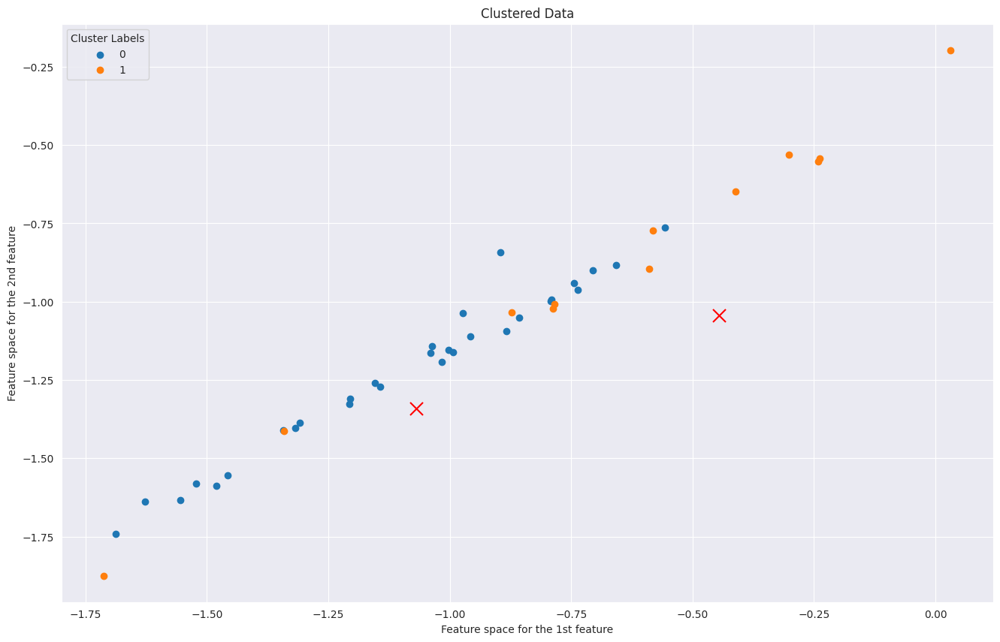

In [ ]:
%%time
# Aproximado 2 minutos

# Veamos la forma de los cluster
model = TimeSeriesKMeans(n_clusters=2, metric='dtw', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=scaled_ts,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

Clusters overlap and cluster number 2 looks like a noise

100%|██████████| 5/5 [00:00<00:00, 21.44it/s]


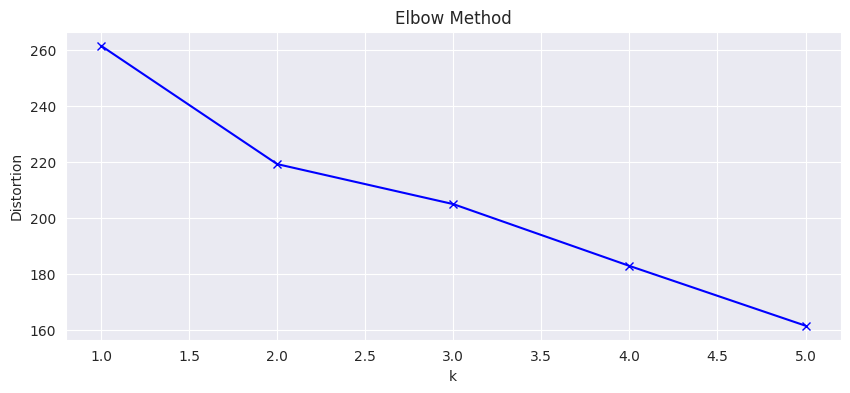

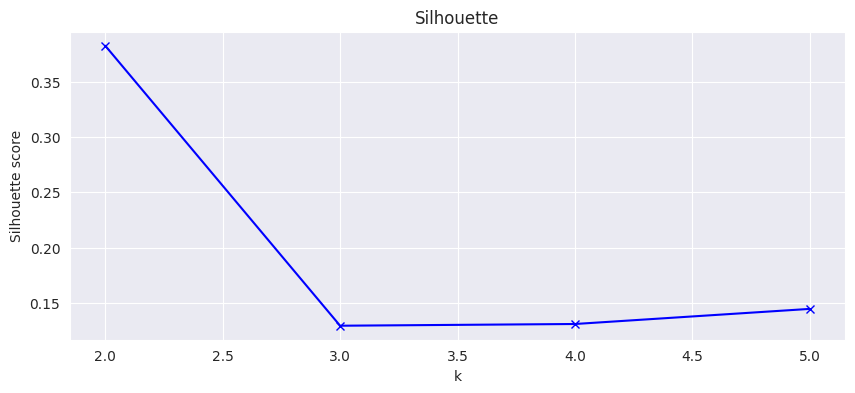

In [ ]:
# Comparemos con métrica euclidiana
get_kmeans_results(data=scaled_ts, max_clusters=5, metric='euclidean', seed=SEED)



### <a id='4.4'>4.4 Reducción de espacio de características</a>

Apliquemos métodos de reducción de dimensionalidad (t-SNE, MDS, VRAE...)

### <a id='4.4.1'>4.4.1 t-SNE</a>

100%|██████████| 10/10 [00:00<00:00, 28.46it/s]


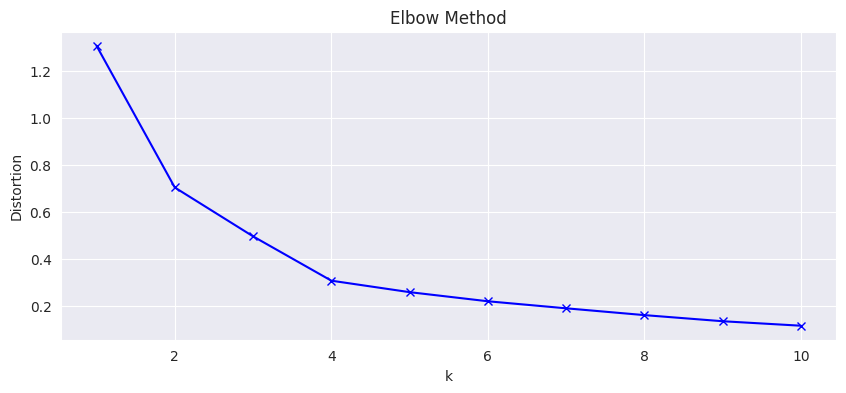

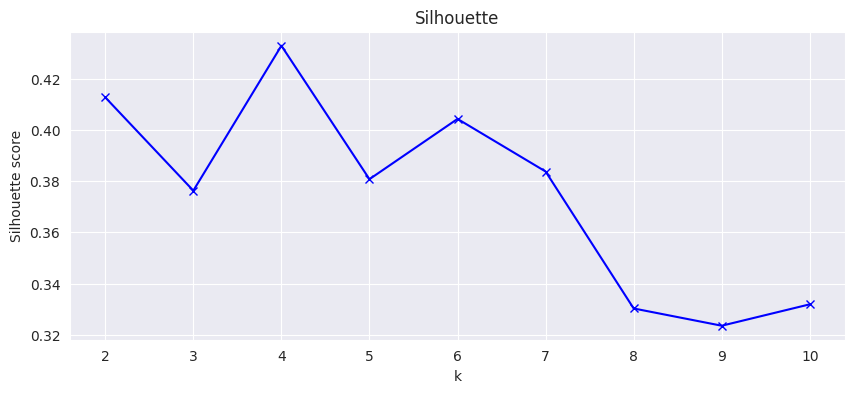

In [ ]:
# Bajando la dimensión a 2D
tsne = TSNE(n_components=2, init='pca', random_state=SEED)
data_tsne = tsne.fit_transform(scaled_ts)

get_kmeans_results(data=data_tsne, max_clusters=10, metric='euclidean', seed=SEED)

In [ ]:
data_tsne.shape

(42, 2)

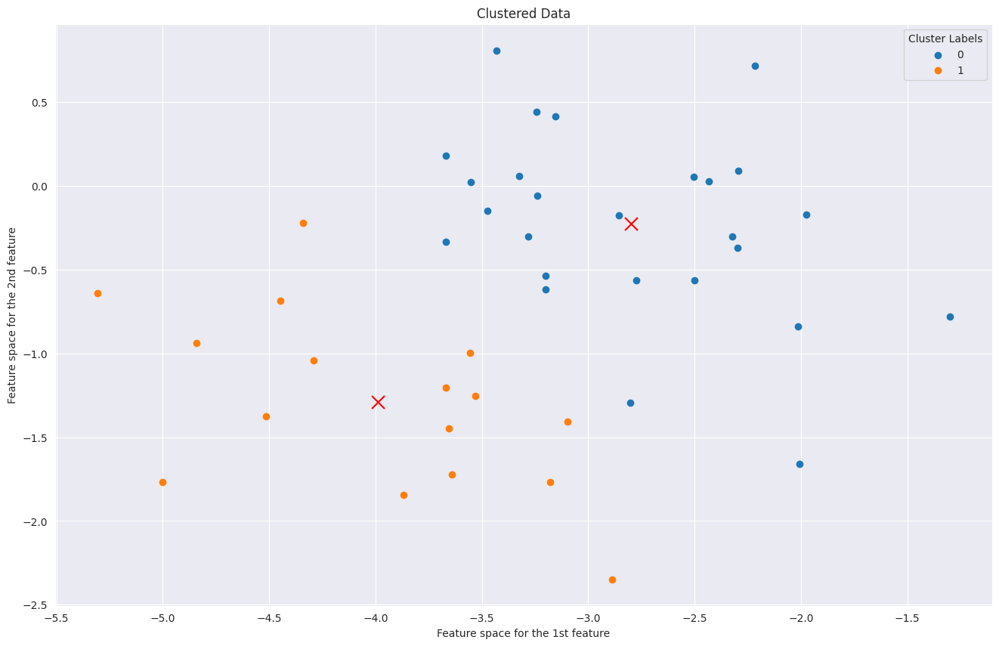

In [ ]:
# Veamos como se el el cluster de 2
model = TimeSeriesKMeans(n_clusters=2, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=data_tsne,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))

### <a id='4.4.2'>4.4.2 MultiDimensional Scaling (MDS)</a>

100%|██████████| 10/10 [00:00<00:00, 11.34it/s]


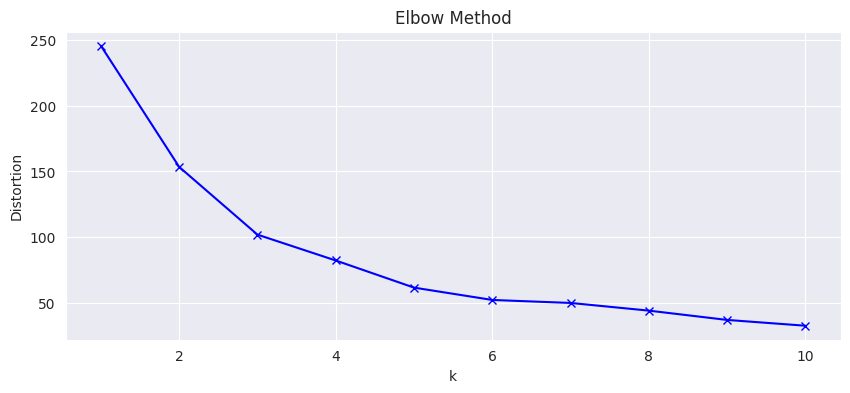

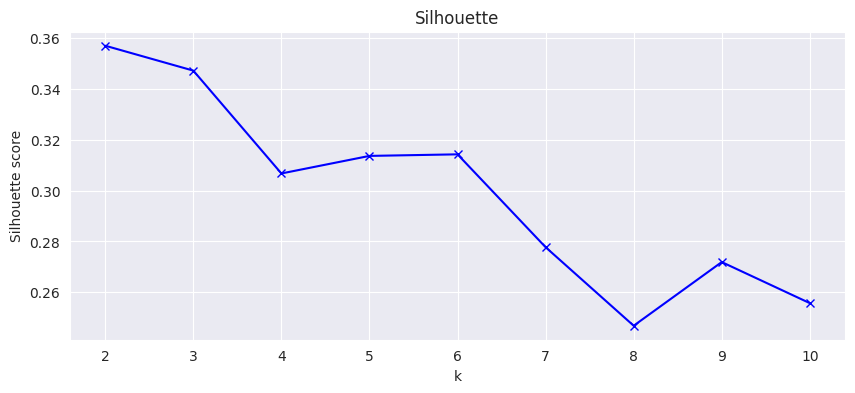

In [ ]:
mds = MDS(n_components=2, n_init=3, max_iter=100, random_state=SEED)
data_mds = mds.fit_transform(scaled_ts)

get_kmeans_results(data=data_mds, max_clusters=10, metric='euclidean', seed=SEED)

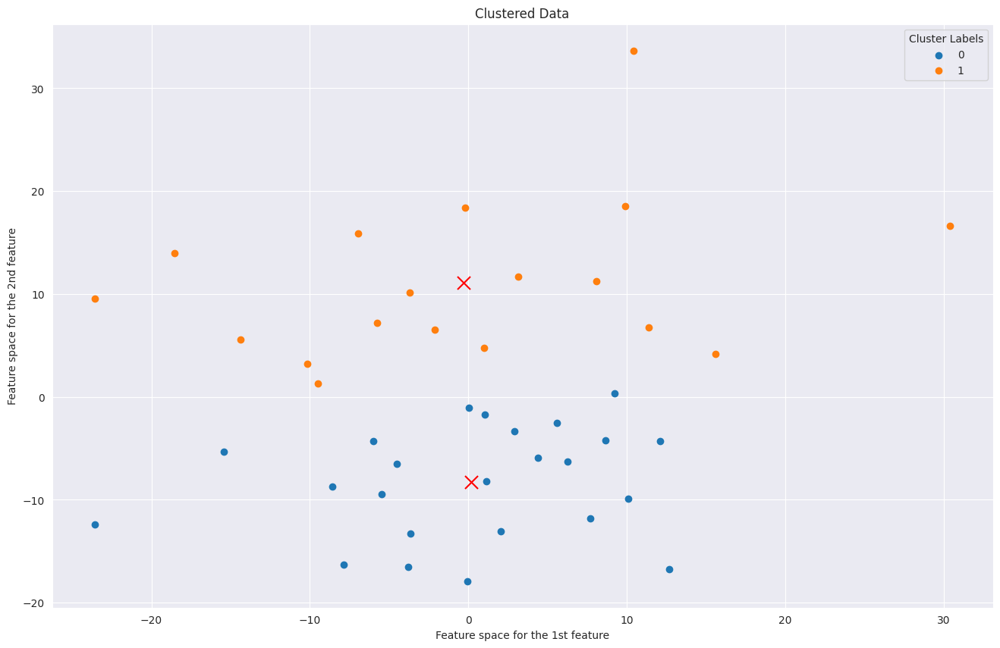

In [ ]:
model = TimeSeriesKMeans(n_clusters=2, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=data_mds,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))



### <a id='4.5'>4.5 Hierarchical Agglomerative Clustering (HAC)</a>

In [ ]:
# HAC clustering
def get_hac_results(data, max_clusters=10, linkage='euclidean', seed=23):
    silhouette = []
    clusters_range = range(2, max_clusters+1)
    for K in tqdm(clusters_range):
        model = AgglomerativeClustering(n_clusters=K, linkage=linkage)
        model.fit(data)
        silhouette.append(silhouette_score(data, model.labels_))

    # Plot
    plt.figure(figsize=(10,4))
    plt.plot(clusters_range, silhouette, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Silhouette score')
    plt.title('Silhouette')
    plt.grid(True);

100%|██████████| 9/9 [00:00<00:00, 267.97it/s]


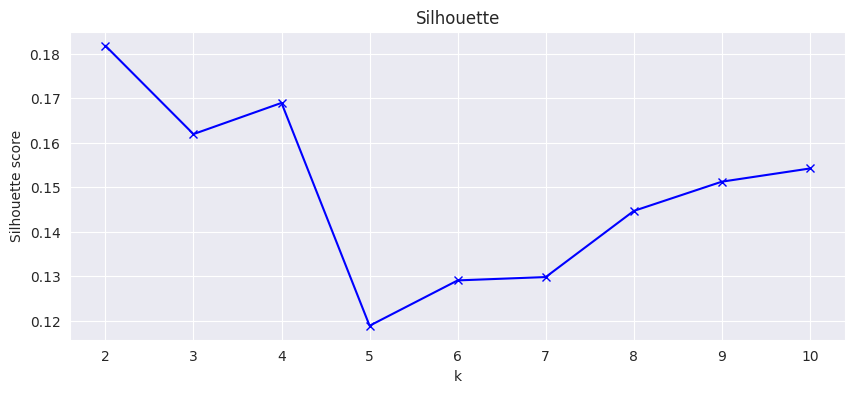

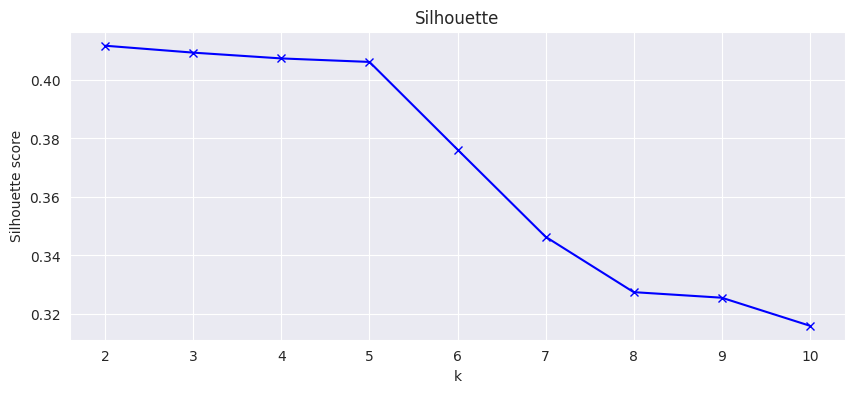

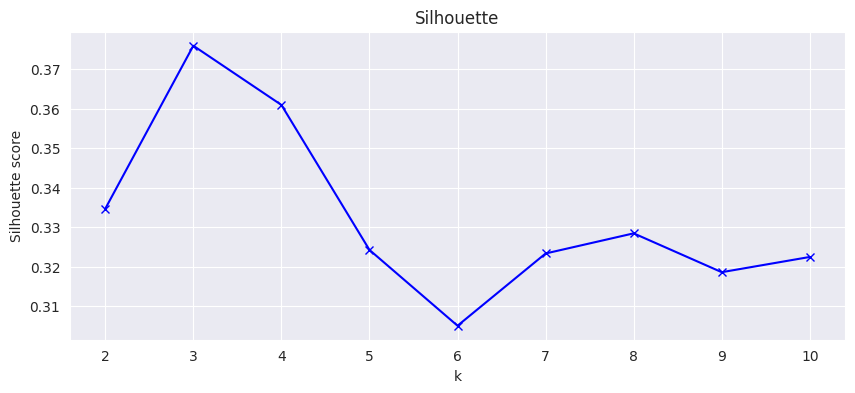

In [ ]:
# Veamos los resultados
features_df = [scaled_ts, data_tsne, data_mds]
for df in features_df:
    get_hac_results(data=df, max_clusters=10, linkage='ward', seed=SEED)

Escojamos 3 clusters con características obtenidas con MDS

In [ ]:
def plot_dendrogram(data, model, figsize=(16,10), **kwargs):
    """
    Plots a dendogram using HAC

    data: pd.DataFrame or np.array
        Time Series Data
    model: Class
        Clustering Model
    figsize: tuple
        Figure size
    Returns:
    -------
    None
    """
    model.fit(data)
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)

    plt.figure(figsize=figsize, dpi=200)
    dendrogram(linkage_matrix, **kwargs)
    plt.title('Dendogram')
    plt.xlabel('Objects')
    plt.ylabel('Distance')
    plt.grid(False)
    plt.tight_layout();

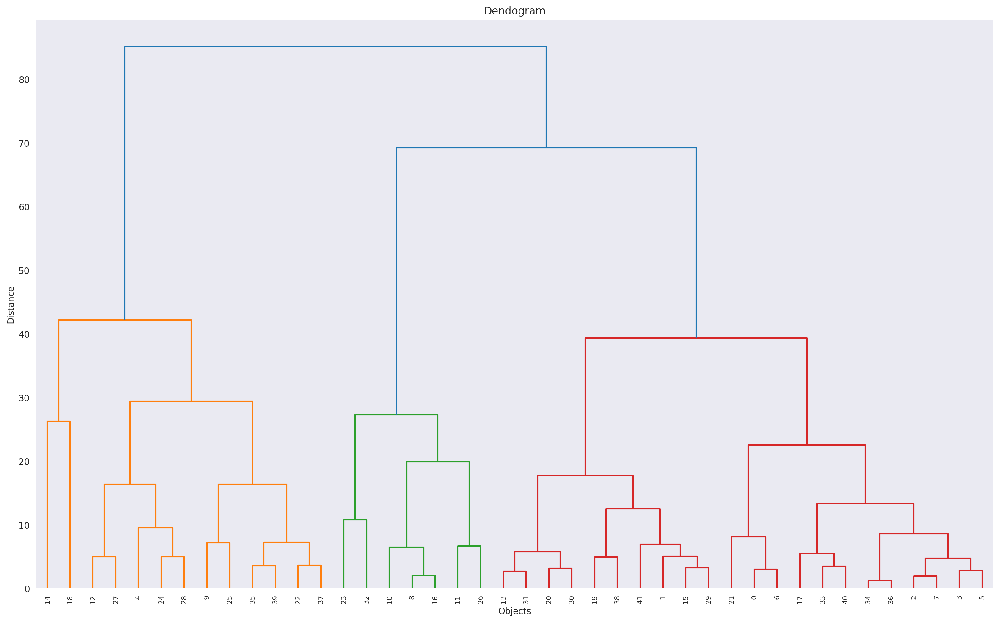

In [ ]:
# Dendrograma
model = AgglomerativeClustering(n_clusters=3, linkage='ward', compute_distances=True)

plot_dendrogram(data=features_df[-1],
                model=model,
                color_threshold=60)

###  <a id='4.6'>4.6 Resultados de K-Means a series de tiempo</a>

Finalmente, usaremos TimeSeriesKMeans con cantidad de caracteristicas reducidas mediante MDS y 5 clusters.

Podemos utilizar 5 clusters/grupos para tratar de observar cosas nuevas.

In [ ]:
# Entrenar TimeSeriesKMeans con MDS
kmeans_model = TimeSeriesKMeans(n_clusters=5, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)
cluster_labels = kmeans_model.fit_predict(data_mds)

ts_clustered = [ scaled_ts[(cluster_labels == lable), :] for lable in np.unique(cluster_labels)]

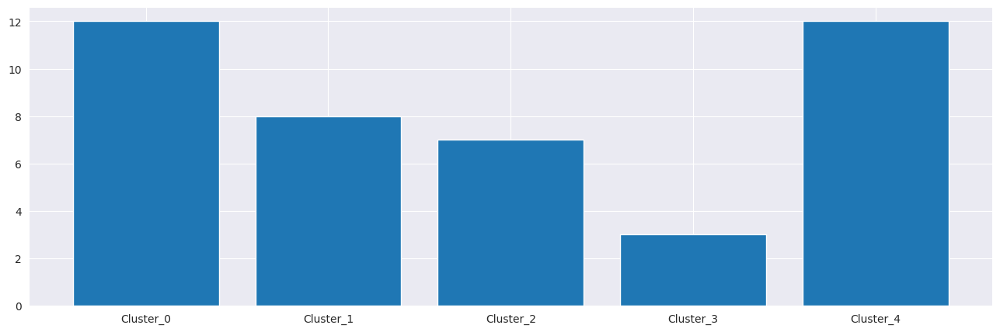

In [ ]:
# Distribución de los clusters obtenidos
labels = [f'Cluster_{i}' for i in range(len(ts_clustered))]
samples_in_cluster = [val.shape[0] for val in ts_clustered]

plt.figure(figsize=(16,5))
plt.bar(labels, samples_in_cluster);

In [ ]:
def plot_cluster_ts(current_cluster):
    """
    Plots time series in a cluster

    current_cluster: np.array
        Cluster with time series
    Returns:
    -------
    None
    """
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0]/4)),4,
        figsize=(45, 3*int(np.ceil(current_cluster.shape[0]/4)))
    )
    fig.autofmt_xdate(rotation=45)
    ax = ax.reshape(-1)
    for indx, series in enumerate(current_cluster):
        ax[indx].plot(series)
        plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show();

Let's have a look at the obtained clusters

==========Cluster Número: 0==========


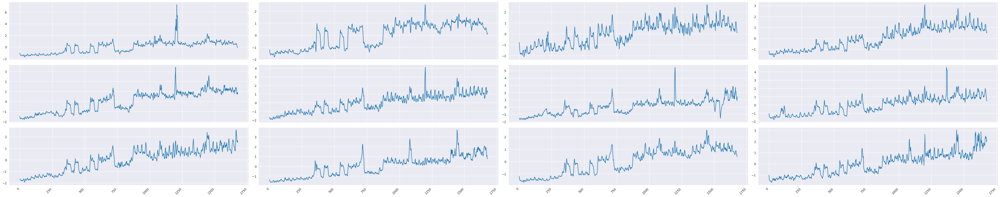

==========Cluster Número: 1==========


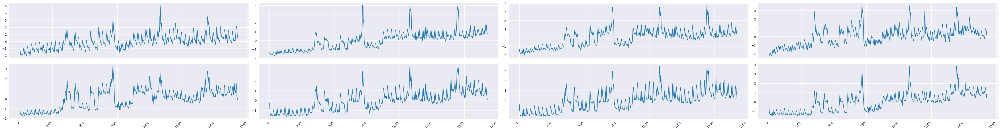

==========Cluster Número: 2==========


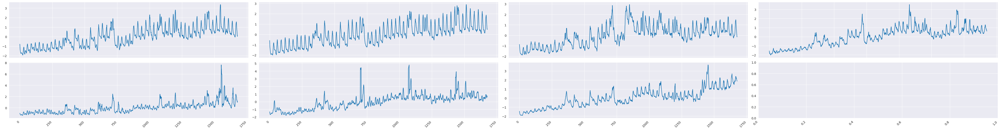

==========Cluster Número: 3==========


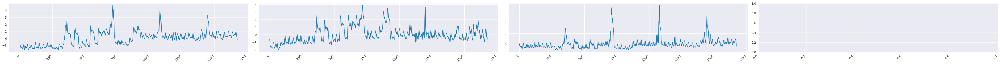

==========Cluster Número: 4==========


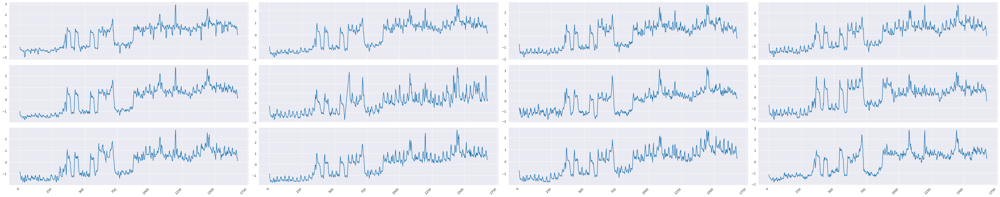

In [ ]:
for cluster in range(len(ts_clustered)):
    print(f"==========Cluster Número: {cluster}==========")
    plot_cluster_ts(ts_clustered[cluster])

### <a id='5'>5. Extracción de series por Cluster</a>
¿Que hacer con lo anterior? Dependiendo del problema, podriamos extraer mas información al conseguir una serie de tiempo por cluster (una serie que describa mejor al cluster que cada serie por separado)

Hay varias opciones:

1. Usar el centroide del cluster
2. Tomar la serie promedio
3. Tomar una serie que tenga minima distancia al centroide del cluster
4. <a href='https://tslearn.readthedocs.io/en/stable/variablelength.html#barycenter-computation'>Método DBA</a>

Veremos el segundo, tercer y cuarto punto.

In [ ]:
# Serie mas cercana al centroide del cluster (punto 3)
closest_clusters_indxs = [np.argmin([np.linalg.norm(cluster_center - point, ord=2) for point in data_mds]) \
                                                                        for cluster_center in kmeans_model.cluster_centers_]

closest_ts = scaled_ts[closest_clusters_indxs, :]

In [ ]:
# DBA (punto 4)
dba_ts = [dtw_barycenter_averaging(cluster_serieses, max_iter=10, verbose=True) for cluster_serieses in ts_clustered]

Attempt 1
[DBA] epoch 1, cost: 48.834
[DBA] epoch 2, cost: 32.197
[DBA] epoch 3, cost: 30.266
[DBA] epoch 4, cost: 29.579
[DBA] epoch 5, cost: 29.304
[DBA] epoch 6, cost: 29.160
[DBA] epoch 7, cost: 29.061
[DBA] epoch 8, cost: 29.009
[DBA] epoch 9, cost: 28.974
[DBA] epoch 10, cost: 28.941
Attempt 1
[DBA] epoch 1, cost: 45.424
[DBA] epoch 2, cost: 33.398
[DBA] epoch 3, cost: 31.419
[DBA] epoch 4, cost: 30.608
[DBA] epoch 5, cost: 30.257
[DBA] epoch 6, cost: 30.120
[DBA] epoch 7, cost: 30.071
[DBA] epoch 8, cost: 30.044
[DBA] epoch 9, cost: 30.021
[DBA] epoch 10, cost: 30.010
Attempt 1
[DBA] epoch 1, cost: 114.166
[DBA] epoch 2, cost: 77.469
[DBA] epoch 3, cost: 70.499
[DBA] epoch 4, cost: 67.733
[DBA] epoch 5, cost: 65.257
[DBA] epoch 6, cost: 64.557
[DBA] epoch 7, cost: 64.322
[DBA] epoch 8, cost: 64.129
[DBA] epoch 9, cost: 64.047
[DBA] epoch 10, cost: 64.029
Attempt 1
[DBA] epoch 1, cost: 113.902
[DBA] epoch 2, cost: 66.235
[DBA] epoch 3, cost: 58.039
[DBA] epoch 4, cost: 55.206
[DB

Comparemos como ambos métodos afectan los clusters.

**Si se escoge un cluster con pocas series de tiempo, se puede ver mejor las diferencias**

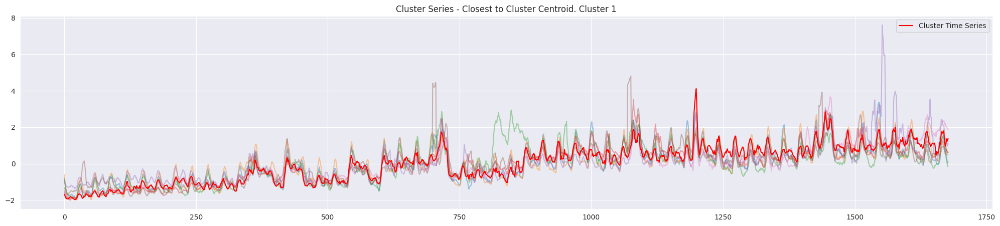

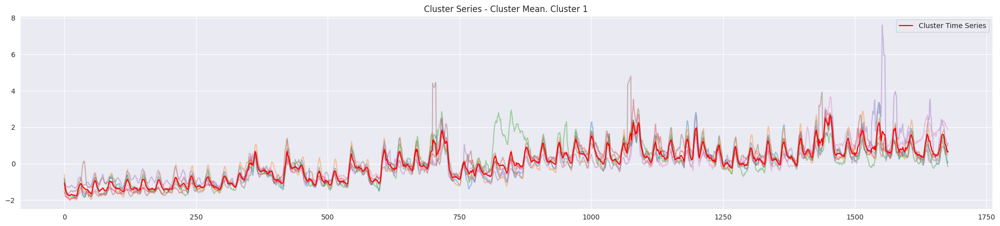

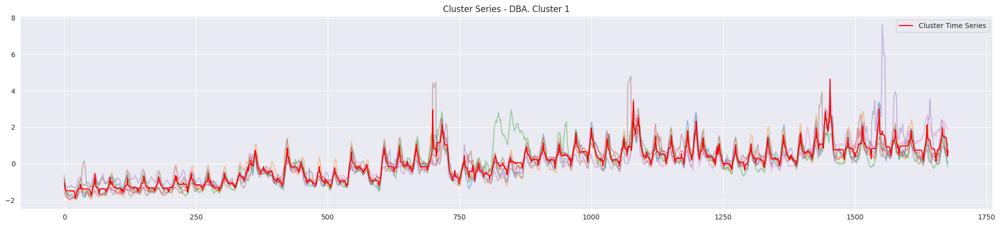

In [ ]:
CLUSTER_N = 2

plt.figure(figsize=(25, 5))
plt.plot(ts_clustered[CLUSTER_N].T,  alpha = 0.4) # all series in the cluster_1
plt.plot(closest_ts[CLUSTER_N], c = 'r', label='Cluster Time Series')
plt.title('Cluster Series - Closest to Cluster Centroid. Cluster 1')
plt.legend();

plt.figure(figsize=(25, 5))
plt.plot(ts_clustered[CLUSTER_N].T,  alpha = 0.4)
plt.plot(np.mean(ts_clustered[CLUSTER_N], axis=0), c = 'r', label='Cluster Time Series')
plt.title('Cluster Series - Cluster Mean. Cluster 1')
plt.legend();

plt.figure(figsize=(25, 5))
plt.plot(ts_clustered[CLUSTER_N].T,  alpha = 0.4)
plt.plot(dba_ts[CLUSTER_N], c = 'r', label='Cluster Time Series')
plt.title('Cluster Series - DBA. Cluster 1')
plt.legend();

### <a id='5.1'>5.1 Cluster Series DBA</a>
Todas las series representativas de cluster, calculadas con DBA

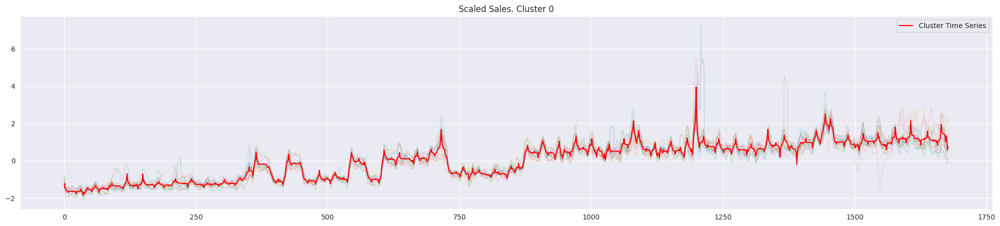

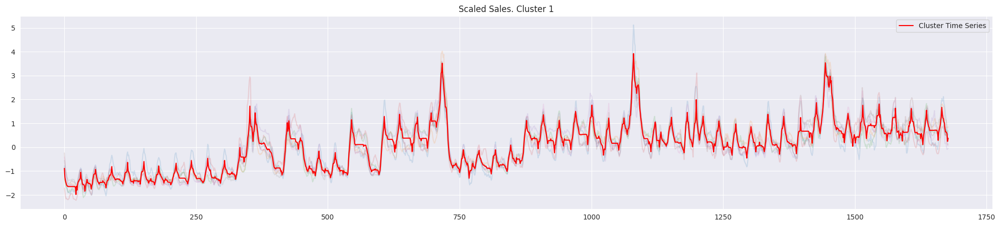

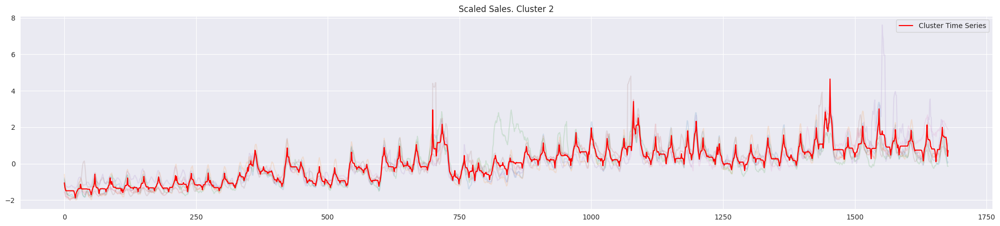

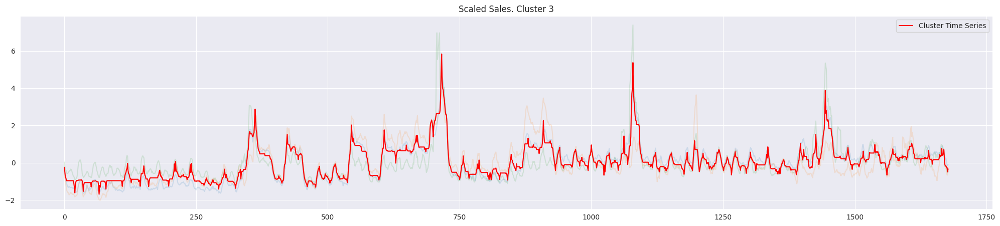

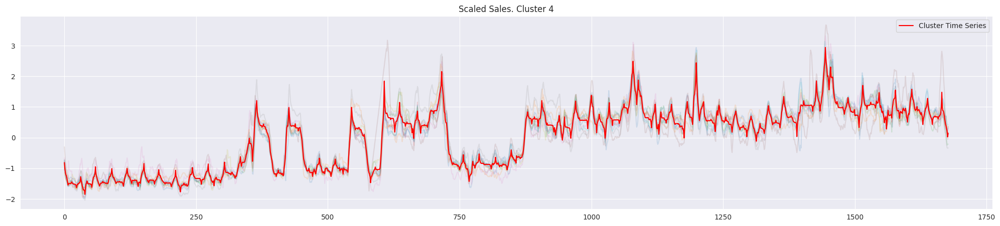

In [ ]:
for indx, series in enumerate(dba_ts):
    plt.figure(figsize=(25, 5))
    plt.plot(ts_clustered[indx].T,  alpha = 0.15)
    plt.plot(series, c = 'r', label='Cluster Time Series')
    plt.title(f'Scaled Sales. Cluster {indx}')
    plt.legend();

### <a id='6'>6. Encajes a series de tiempo</a>

Entrenaremos Redes Neuronales (Recurrent Auto-encoders with LSTM / GRU blocks) y una representasión vectorial de las series (embedding/encaje)

El algoritmo es no supervisado. Los encajes que se obtengan se clusterizan al final

In [ ]:
os.chdir('./timeseries-clustering-vae')

from vrae.vrae import VRAE
from vrae.utils import *

import torch
import plotly
from torch.utils.data import DataLoader, TensorDataset
plotly.offline.init_notebook_mode()

In [ ]:
vrae_df = scaled_ts.copy()

# Data descargada del github copiado al inicio
dload = '/content/timeseries_clustering_vae/'

In [ ]:
# Parámetros del modelo
hidden_size = 50
hidden_layer_depth = 1
latent_length = 20
batch_size = 5
learning_rate = 0.005
n_epochs = 40
dropout_rate = 0.1
optimizer = 'Adam' # Adam/SGD
cuda = True # Usar GPU
print_every=30
clip = True
max_grad_norm=5
loss = 'MSELoss' # SmoothL1Loss/MSELoss
block = 'LSTM' # LSTM/GRU

In [ ]:
# No usamos datos para test, creamos los datos de entrenamiento con toda la data disponible
X_train = np.expand_dims(scaled_ts, -1)
train_dataset = TensorDataset(torch.from_numpy(X_train))

sequence_length = X_train.shape[1]
number_of_features = X_train.shape[2]

In [ ]:
# Creación del modelo
vrae = VRAE(sequence_length=sequence_length,
            number_of_features = number_of_features,
            hidden_size = hidden_size,
            hidden_layer_depth = hidden_layer_depth,
            latent_length = latent_length,
            batch_size = batch_size,
            learning_rate = learning_rate,
            n_epochs = n_epochs,
            dropout_rate = dropout_rate,
            optimizer = optimizer,
            cuda = cuda,
            print_every=print_every,
            clip=clip,
            max_grad_norm=max_grad_norm,
            loss = loss,
            block = block,
            dload = dload)

In [ ]:
%%time

vrae.fit(train_dataset)

Epoch: 0
Average loss: 9660.1420
Epoch: 1
Average loss: 9578.1617
Epoch: 2
Average loss: 9537.3380
Epoch: 3
Average loss: 34152.9701
Epoch: 4
Average loss: 14188.6575
Epoch: 5
Average loss: 11382.3486
Epoch: 6
Average loss: 9949.3541
Epoch: 7
Average loss: 9790.5340
Epoch: 8
Average loss: 9628.1811
Epoch: 9
Average loss: 9605.8331
Epoch: 10
Average loss: 9603.7906
Epoch: 11
Average loss: 9585.7768
Epoch: 12
Average loss: 9567.5423
Epoch: 13
Average loss: 9725.5791
Epoch: 14
Average loss: 10347.5835
Epoch: 15
Average loss: 9467.0560
Epoch: 16
Average loss: 9560.0750
Epoch: 17
Average loss: 9429.1795
Epoch: 18
Average loss: 25673.4787
Epoch: 19
Average loss: 10813.6113
Epoch: 20
Average loss: 9969.0137
Epoch: 21
Average loss: 9678.5403
Epoch: 22
Average loss: 9641.6511
Epoch: 23
Average loss: 9599.9788
Epoch: 24
Average loss: 9582.7992
Epoch: 25
Average loss: 9573.8301
Epoch: 26
Average loss: 9475.4908
Epoch: 27
Average loss: 12623.8868
Epoch: 28
Average loss: 10620.7208
Epoch: 29
Averag

100%|██████████| 10/10 [00:00<00:00, 35.90it/s]


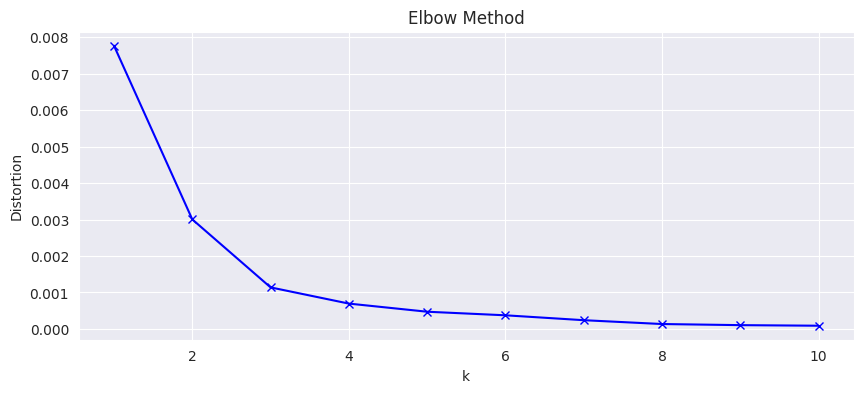

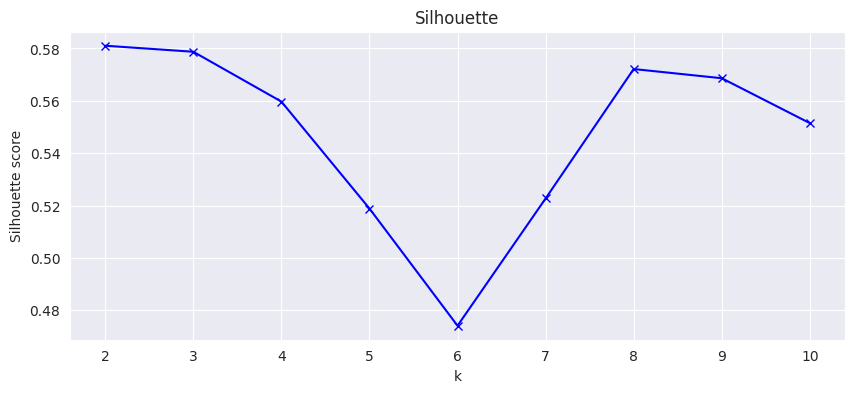

In [ ]:
# Ver los encajes
embeddings = vrae.transform(train_dataset)

# Agrupar (Clusterizar) los encajes
get_kmeans_results(data=embeddings, max_clusters=10, metric='euclidean', seed=SEED)

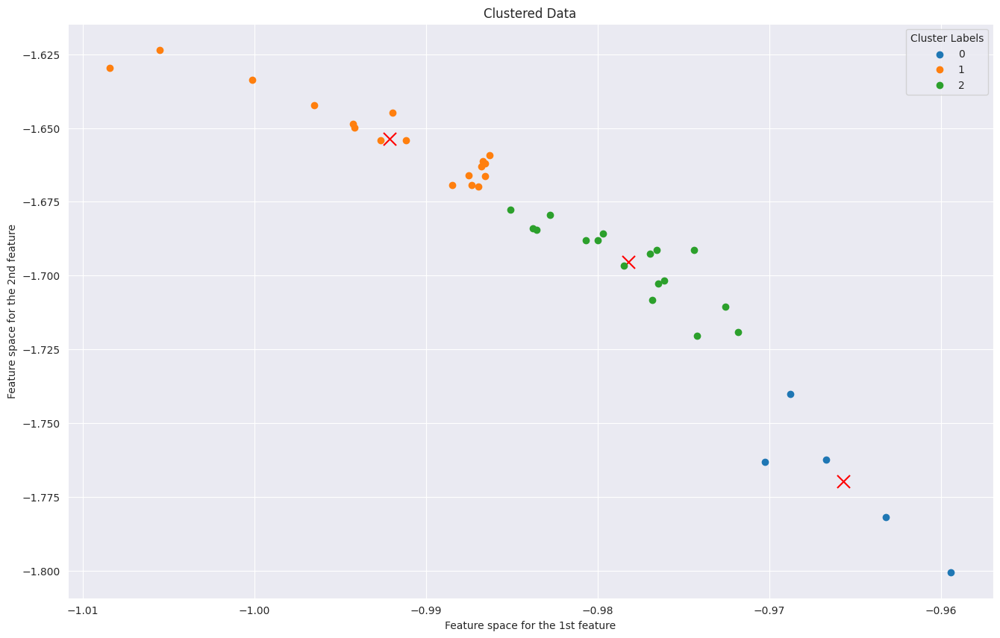

In [ ]:
model = TimeSeriesKMeans(n_clusters=3, metric='euclidean', n_jobs=-1, max_iter=10, random_state=SEED)

plot_clusters(data=embeddings,
              cluster_model=model,
              dim_red_algo=TSNE(n_components=2, init='pca', random_state=SEED))



### <a id='7'>7. Referencias</a>
- https://www.kaggle.com/izzettunc/introduction-to-time-series-clustering/notebook

- https://github.com/tejaslodaya/timeseries-clustering-vae
